# BART PROJECT

<img src='BART-system-map-everyday.png'>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df=pd.read_csv('BART.csv')

### EDA

In [3]:
df.head()

,Date,Hour,Origin Station,Destination Station,Trip Count
0,2021-01-01,6,CIVC,POWL,2
1,2021-01-01,6,EMBR,EMBR,2
2,2021-01-01,6,LAKE,POWL,1
3,2021-01-01,7,12TH,DBRK,1
4,2021-01-01,7,12TH,POWL,1


In [4]:
df.tail()

,Date,Hour,Origin Station,Destination Station,Trip Count
14843429,2022-12-31,23,WOAK,MCAR,1
14843430,2022-12-31,23,WOAK,MLBR,1
14843431,2022-12-31,23,WOAK,MONT,2
14843432,2022-12-31,23,WOAK,POWL,9
14843433,2022-12-31,23,WOAK,SBRN,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14843434 entries, 0 to 14843433
Data columns (total 5 columns):
 #   Column               Dtype 
---  ------               ----- 
 0   Date                 object
 1   Hour                 int64 
 2   Origin Station       object
 3   Destination Station  object
 4   Trip Count           int64 
dtypes: int64(2), object(3)
memory usage: 566.2+ MB


In [6]:
df.describe()

,Hour,Trip Count
count,1.484343e+07,1.484343e+07
mean,1.363207e+01,4.510489e+00
std,5.104472e+00,8.080307e+00
min,0.000000e+00,1.000000e+00
25%,9.000000e+00,1.000000e+00
50%,1.400000e+01,2.000000e+00
75%,1.800000e+01,4.000000e+00
max,2.300000e+01,5.640000e+02


In [7]:
df.corr()

C:\Users\rana_\AppData\Local\Temp\ipykernel_13552\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Hour,Trip Count
Hour,1.000000,-0.018284
Trip Count,-0.018284,1.000000


In [8]:
df.shape

(14843434, 5)

In [9]:
df.isnull().sum()

Date                   0
Hour                   0
Origin Station         0
Destination Station    0
Trip Count             0
dtype: int64

In [10]:
df['Trip Count']=df['Trip Count'].astype(int)

In [11]:
df['Hour']=df['Hour'].astype(int)

In [12]:
df['Hour'].value_counts()

17    1052635
18    1011420
16    1003811
8      945814
15     927372
9      880278
14     873255
19     849652
13     845154
12     825689
10     821635
11     814712
7      811723
20     699371
6      604925
21     597533
22     462342
23     303184
5      250922
0      188612
1       61869
4        5615
2        5320
3         591
Name: Hour, dtype: int64

In [13]:
#17.00 - 19.00 arası en yoğun saatler

In [14]:
# İstasyonlara göre toplam yolcu sayısını hesapla
grouped_data = df.groupby('Origin Station')['Trip Count'].sum()

# En yoğun istasyonu bul
en_yogun_istasyon = grouped_data.idxmax()
en_yogun_yolcu_sayisi = grouped_data[en_yogun_istasyon]

print("En yoğun istasyon:", en_yogun_istasyon)
print("Toplam yolcu sayısı:", en_yogun_yolcu_sayisi)

En yoğun istasyon: POWL
Toplam yolcu sayısı: 5768738


In [15]:
# İstasyonlara göre toplam yolcu sayısını hesapla
grouped_data2 = df.groupby(['Origin Station', 'Destination Station'])['Trip Count'].sum()

# En az popüler rotayı bul
en_az_populer_rotalar = grouped_data2.idxmin()
en_az_populer_yolcu_sayisi = grouped_data2[en_az_populer_rotalar]

print("En az popüler rota:", en_az_populer_rotalar)
print("Toplam yolcu sayısı:", en_az_populer_yolcu_sayisi)

En az popüler rota: ('ORIN', 'WDUB')
Toplam yolcu sayısı: 88


In [16]:
#DATE sutununu tarihe ceviriyoruz.haftanin gunlerinin yogunlugunu ayrica gorebilmek icin de weekday sutunu olusturup gunlere atiyoruz

In [17]:
# Tarih sütununu datetime formatına dönüştür
df['Date'] = pd.to_datetime(df['Date'])

# Haftanın günlerini temsil eden yeni bir sütun oluştur
df['Weekday'] = df['Date'].dt.weekday

# Haftanın günlerini günlere çevir
haftanin_gunleri = ['Pazartesi', 'Salı', 'Çarşamba', 'Perşembe', 'Cuma', 'Cumartesi', 'Pazar']
df['Weekday'] = df['Weekday'].map(lambda x: haftanin_gunleri[x])

In [18]:
# Ay sütununu datetime formatına dönüştür
df['Month'] = df['Date'].dt.month

# Sonuçları kontrol et
print(df[['Date', 'Month']])

               Date  Month
0        2021-01-01      1
1        2021-01-01      1
2        2021-01-01      1
3        2021-01-01      1
4        2021-01-01      1
...             ...    ...
14843429 2022-12-31     12
14843430 2022-12-31     12
14843431 2022-12-31     12
14843432 2022-12-31     12
14843433 2022-12-31     12

[14843434 rows x 2 columns]


In [19]:
df['Year'] = df['Date'].dt.year

In [20]:
df['Year'].value_counts()

2022    8245370
2021    6598064
Name: Year, dtype: int64

In [21]:
#Soruya cevap verebilmek için Gidilen rotanın "Ashby" ve varış istasyonunun "Powell" olduğu satırları filtreliyoruz
filtered_df = df[(df['Origin Station'] == 'ASHB') & (df['Destination Station'] == 'POWL')]

In [22]:
# Aylara göre iki rota arasındaki toplam seyahat sayısını hesaplıyoruz
grouped_data = filtered_df.groupby('Month').sum(numeric_only=True)['Trip Count'].reset_index(name='Total Trip Count')

# Ayları doğru bir şekilde sırala
grouped_data = grouped_data.sort_values('Month')

figure = px.bar(grouped_data, x='Month', y='Total Trip Count')

# Grafiği göster
figure.show()

In [23]:
# Haftanın günlerine göre toplam seyahat sayısını hesapla
grouped_data = filtered_df.groupby('Weekday').sum(numeric_only=True)['Trip Count'].reset_index(name='Total Trip Count')
# Günleri doğru bir şekilde sırala
weekdays = ['Pazartesi', 'Salı', 'Çarşamba', 'Perşembe', 'Cuma', 'Cumartesi', 'Pazar']
grouped_data['Weekday'] = pd.Categorical(grouped_data['Weekday'], categories=weekdays, ordered=True)
grouped_data = grouped_data.sort_values('Weekday')

figure = px.bar(grouped_data, x='Weekday', y='Total Trip Count')

# Grafiği göster
figure.show()

In [24]:
# Pazar gününü filtrele
sunday_data = filtered_df[filtered_df['Weekday'] == 'Pazar']

# Saatlere göre yolcu toplamını hesapla
hourly_total = sunday_data.groupby('Hour').sum(numeric_only=True)['Trip Count'].reset_index()

# Tabloyu oluştur
table = pd.DataFrame({'Hour': hourly_total['Hour'], 'Total Trip Count': hourly_total['Trip Count']})

# Tabloyu saat sırasına göre sırala
table = table.sort_values('Hour')

# Tabloyu göster
print(table)

    Hour  Total Trip Count
0      0                20
1      1                 6
2      8               177
3      9               240
4     10               510
5     11               570
6     12               603
7     13               658
8     14               556
9     15               404
10    16               397
11    17               353
12    18               284
13    19               207
14    20               149
15    21               106
16    22                49
17    23                36


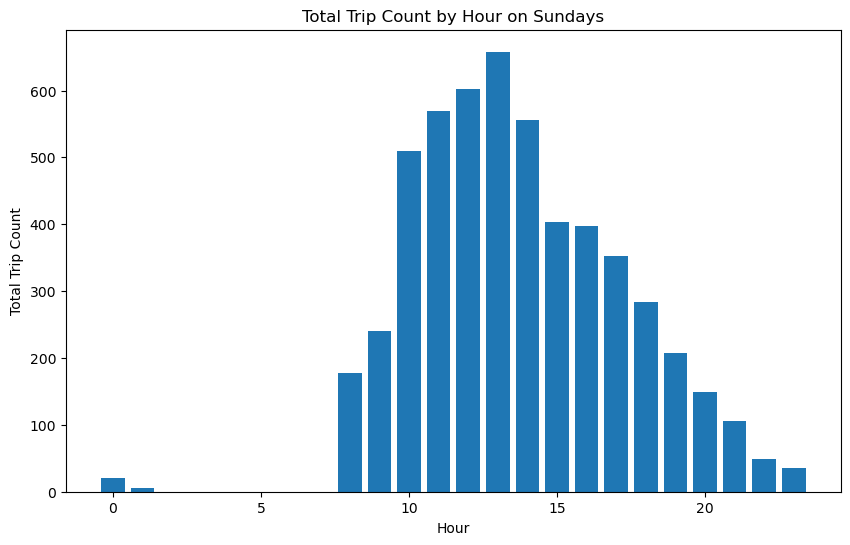

In [25]:
#grafikte gosterimi
# Grafik boyutunu belirle
plt.figure(figsize=(10, 6))

# Çubuk grafik oluştur
plt.bar(table['Hour'], table['Total Trip Count'])

# Eksen etiketlerini ve başlığı ayarla
plt.xlabel('Hour')
plt.ylabel('Total Trip Count')
plt.title('Total Trip Count by Hour on Sundays')

# Grafikleri göster
plt.show()

In [26]:
# Haftanın günlerine göre toplam seyahat sayısını hesapla
grouped_data = df.groupby('Weekday').sum(numeric_only=True)['Trip Count'].reset_index(name='Total Trip Count')
# Günleri doğru bir şekilde sırala
weekdays = ['Pazartesi', 'Salı', 'Çarşamba', 'Perşembe', 'Cuma', 'Cumartesi', 'Pazar']
grouped_data['Weekday'] = pd.Categorical(grouped_data['Weekday'], categories=weekdays, ordered=True)
grouped_data = grouped_data.sort_values('Weekday')

figure = px.bar(grouped_data, x='Weekday', y='Total Trip Count')

# Grafiği göster
figure.show()

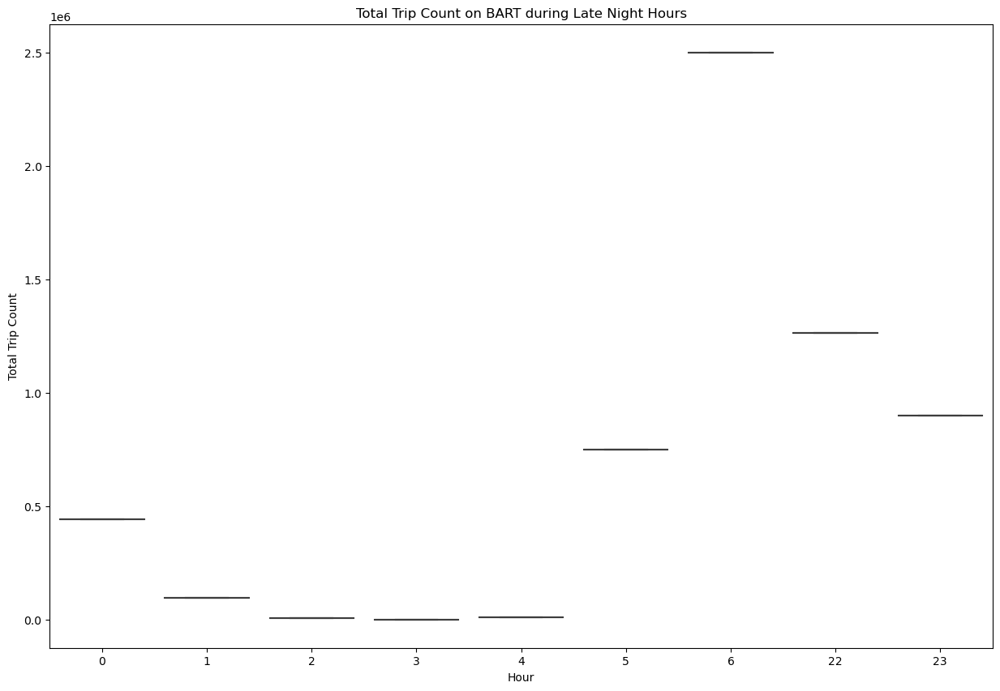

In [27]:
# Gece geç saatlerin zaman aralığını belirle
start_time_1 = 22
end_time_1 = 23
start_time_2 = 0
end_time_2 = 6

# Gece geç saatlerdeki verileri filtrele
night_data = df[((df['Hour'] >= start_time_1) & (df['Hour'] <= end_time_1)) | ((df['Hour'] >= start_time_2) & (df['Hour'] <= end_time_2))]

# Saat dilimlerine göre yolcu sayısını hesapla
hourly_total = night_data.groupby('Hour').sum(numeric_only=True)['Trip Count'].reset_index()

# Grafik boyutunu belirle
plt.figure(figsize=(15, 10))

# Çizgi grafiği oluştur
sns.boxplot(data=hourly_total, x='Hour', y='Trip Count')

# Eksen etiketlerini ve başlığı ayarla
plt.xlabel('Hour')
plt.ylabel('Total Trip Count')
plt.title('Total Trip Count on BART during Late Night Hours')

# Grafikleri göster
plt.show()

In [28]:
# Toplam yolcu sayısını hesapla
total_count = hourly_total['Trip Count'].sum()

# Verileri tablo olarak göster
print(hourly_total)
print("Toplam yolcu sayısı:", total_count)

   Hour  Trip Count
0     0      441539
1     1       94887
2     2        7101
3     3         839
4     4        8805
5     5      751155
6     6     2499839
7    22     1263269
8    23      900736
Toplam yolcu sayısı: 5968170


In [29]:
df.head()

,Date,Hour,Origin Station,Destination Station,Trip Count,Weekday,Month,Year
0,2021-01-01,6,CIVC,POWL,2,Cuma,1,2021
1,2021-01-01,6,EMBR,EMBR,2,Cuma,1,2021
2,2021-01-01,6,LAKE,POWL,1,Cuma,1,2021
3,2021-01-01,7,12TH,DBRK,1,Cuma,1,2021
4,2021-01-01,7,12TH,POWL,1,Cuma,1,2021


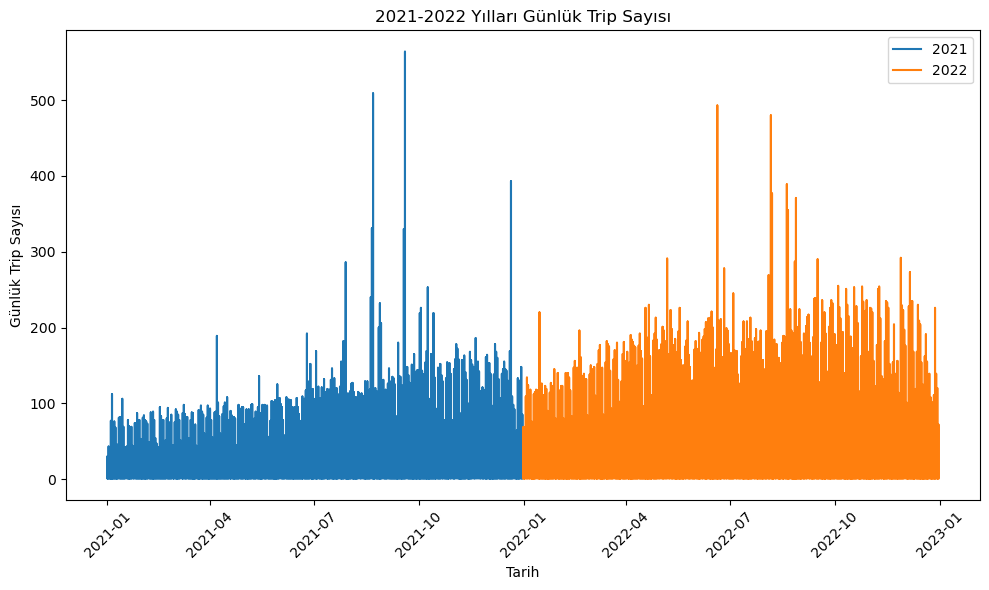

In [30]:
# 2021 ve 2022 yıllarına ait verileri seçme
data_2021 = df[df['Year'] == 2021]
data_2022 = df[df['Year'] == 2022]

# Çizgi grafiklerini oluşturma
plt.figure(figsize=(10, 6))  # Grafik boyutunu ayarlayın

plt.plot(data_2021['Date'], data_2021['Trip Count'], label='2021')
plt.plot(data_2022['Date'], data_2022['Trip Count'], label='2022')
   
    
plt.xlabel('Tarih')
plt.ylabel('Günlük Trip Sayısı')
plt.title('2021-2022 Yılları Günlük Trip Sayısı')
plt.legend()

plt.xticks(rotation=45)  # Tarih etiketlerini 45 derece döndürün
plt.tight_layout()  # Grafiklerin düzgün görünmesini sağlar

plt.show()

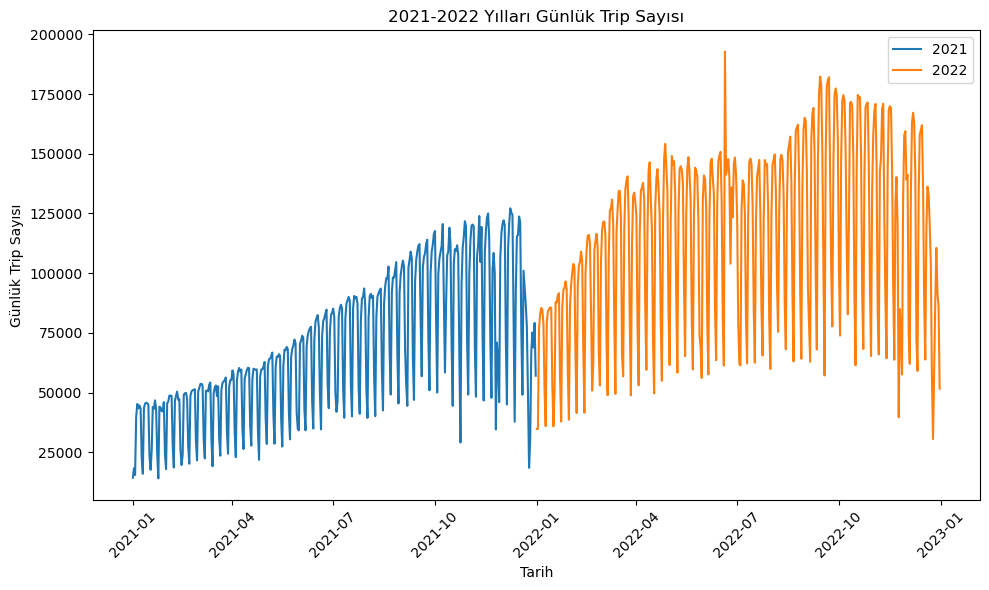

In [31]:
# 2021 ve 2022 yıllarına ait verileri seçme
data_2021 = df[df['Year'] == 2021]
data_2022 = df[df['Year'] == 2022]

# Günlük trip sayılarını toplama
daily_trip_counts_2021 = data_2021.groupby('Date')['Trip Count'].sum().reset_index()
daily_trip_counts_2022 = data_2022.groupby('Date')['Trip Count'].sum().reset_index()

# Çizgi grafiklerini oluşturma
plt.figure(figsize=(10, 6))  # Grafik boyutunu ayarlayın

plt.plot(daily_trip_counts_2021['Date'], daily_trip_counts_2021['Trip Count'], label='2021')
plt.plot(daily_trip_counts_2022['Date'], daily_trip_counts_2022['Trip Count'], label='2022')

plt.xlabel('Tarih')
plt.ylabel('Günlük Trip Sayısı')
plt.title('2021-2022 Yılları Günlük Trip Sayısı')
plt.legend()

plt.xticks(rotation=45)  # Tarih etiketlerini 45 derece döndürün
plt.tight_layout()  # Grafiklerin düzgün görünmesini sağlar

plt.show()

In [33]:
# İstasyonlara göre toplam yolcu sayısını hesapla
grouped_data = df.groupby(['Origin Station', 'Destination Station'])['Trip Count'].sum()

# En popüler rotayı bul
en_populer_rotalar = grouped_data.idxmax()
en_populer_yolcu_sayisi = grouped_data[en_populer_rotalar]

print("En popüler rota:", en_populer_rotalar)
print("Toplam yolcu sayısı:", en_populer_yolcu_sayisi)

En popüler rota: ('POWL', 'BALB')
Toplam yolcu sayısı: 422760


In [35]:
#filtered_data.to_csv('BARTNEW.csv', index=False)

In [36]:
bart_data=pd.read_csv('BARTNEW.csv')

In [37]:
bart_data.head()

,0,1,2,3,4
0,2015-01-01,0,POWL,BALB,39
1,2015-01-01,1,POWL,BALB,115
2,2015-01-01,2,POWL,BALB,95
3,2015-01-01,3,POWL,BALB,32
4,2015-01-01,4,POWL,BALB,1


In [38]:
bart_data.columns = ['Date', 'Hour', 'Origin Station', 'Destination Station', 'Trip Count']

In [39]:
bart_data.tail()

,Date,Hour,Origin Station,Destination Station,Trip Count
56784,2022-12-31,19,POWL,BALB,27
56785,2022-12-31,20,POWL,BALB,13
56786,2022-12-31,21,POWL,BALB,17
56787,2022-12-31,22,POWL,BALB,12
56788,2022-12-31,23,POWL,BALB,14


In [40]:
bart_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56789 entries, 0 to 56788
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Date                 56789 non-null  object
 1   Hour                 56789 non-null  int64 
 2   Origin Station       56789 non-null  object
 3   Destination Station  56789 non-null  object
 4   Trip Count           56789 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ MB


In [41]:
#date sutununu tarih formatina ceviriyoruz
bart_data['Date']=pd.to_datetime(bart_data['Date'],format='%Y-%m-%d')
bart_data['year']=bart_data['Date'].dt.year
bart_data['month']=bart_data['Date'].dt.month
# Haftanın günlerini temsil eden yeni bir sütun oluştur
bart_data['Weekday'] = bart_data['Date'].dt.weekday

# Haftanın günlerini günlere çevir
haftanin_gunleri = ['Pazartesi', 'Salı', 'Çarşamba', 'Perşembe', 'Cuma', 'Cumartesi', 'Pazar']
bart_data['Weekday'] = bart_data['Weekday'].map(lambda x: haftanin_gunleri[x])

In [42]:
bart_data.tail(50)

,Date,Hour,Origin Station,Destination Station,Trip Count,year,month,Weekday
56739,2022-12-29,13,POWL,BALB,20,2022,12,Perşembe
56740,2022-12-29,14,POWL,BALB,45,2022,12,Perşembe
56741,2022-12-29,15,POWL,BALB,67,2022,12,Perşembe
56742,2022-12-29,16,POWL,BALB,108,2022,12,Perşembe
56743,2022-12-29,17,POWL,BALB,139,2022,12,Perşembe
56744,2022-12-29,18,POWL,BALB,69,2022,12,Perşembe
56745,2022-12-29,19,POWL,BALB,43,2022,12,Perşembe
56746,2022-12-29,20,POWL,BALB,24,2022,12,Perşembe
56747,2022-12-29,21,POWL,BALB,12,2022,12,Perşembe
56748,2022-12-29,22,POWL,BALB,9,2022,12,Perşembe


In [43]:
bart_data['year'].value_counts()

2015    7443
2017    7441
2018    7432
2019    7389
2016    7263
2022    7108
2021    6472
2020    6241
Name: year, dtype: int64

In [44]:
#2019 ve 2020 yilina ait verilerde ciddi degisim var

In [45]:
year_2019_trips = bart_data.loc[bart_data['year'] == 2019, 'Trip Count'].sum()
year_2020_trips = bart_data.loc[bart_data['year'] == 2020, 'Trip Count'].sum()

print("2019 yılı toplam seyahat sayısı:", year_2019_trips)
print("2020 yılı toplam seyahat sayısı:", year_2020_trips)

2019 yılı toplam seyahat sayısı: 714398
2020 yılı toplam seyahat sayısı: 211236


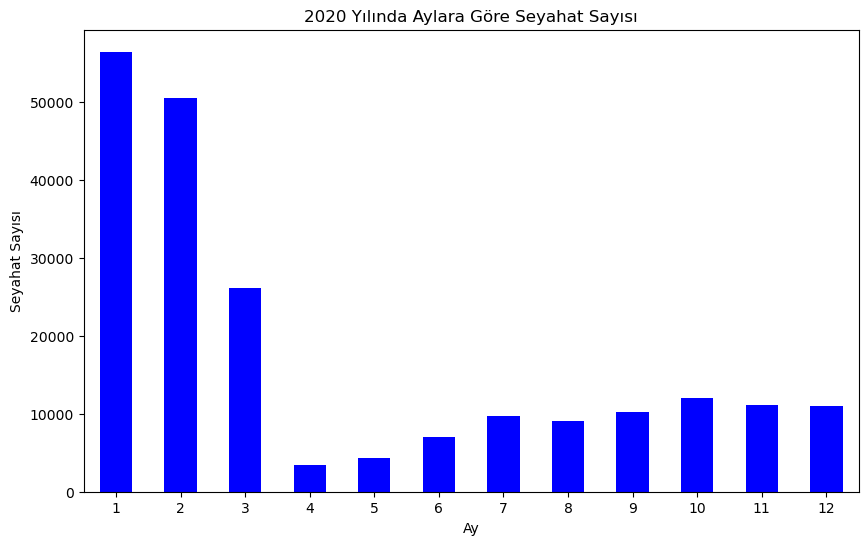

In [46]:
# 2020 yılına ait verileri filtreleme
bart_data_2020 = bart_data[bart_data['year'] == 2020]

# Aylara göre seyahat sayılarını hesaplama
monthly_trips = bart_data_2020.groupby('month')['Trip Count'].sum()

# Grafik oluşturma
plt.figure(figsize=(10, 6))
monthly_trips.plot(kind='bar', color='blue')
plt.xlabel('Ay')
plt.ylabel('Seyahat Sayısı')
plt.title('2020 Yılında Aylara Göre Seyahat Sayısı')
plt.xticks(rotation=0)
plt.show()

In [47]:
#tum yillara bakiyoruz

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


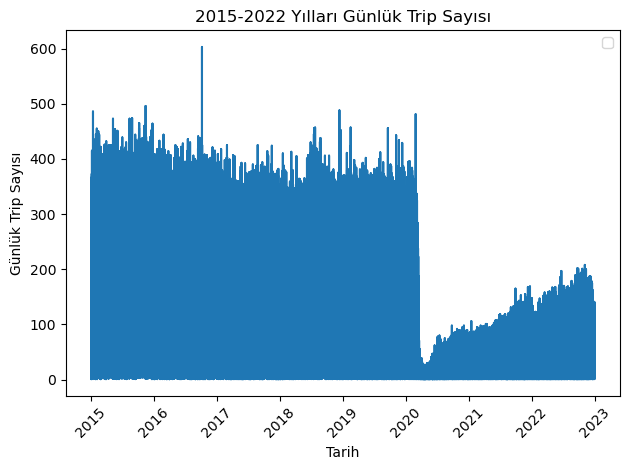

In [48]:
plt.plot(bart_data['Date'], bart_data['Trip Count'])

plt.xlabel('Tarih')
plt.ylabel('Günlük Trip Sayısı')
plt.title('2015-2022 Yılları Günlük Trip Sayısı')
plt.legend()

plt.xticks(rotation=45)  # Tarih etiketlerini 45 derece döndürün
plt.tight_layout()  # Grafiklerin düzgün görünmesini sağlar

plt.show()

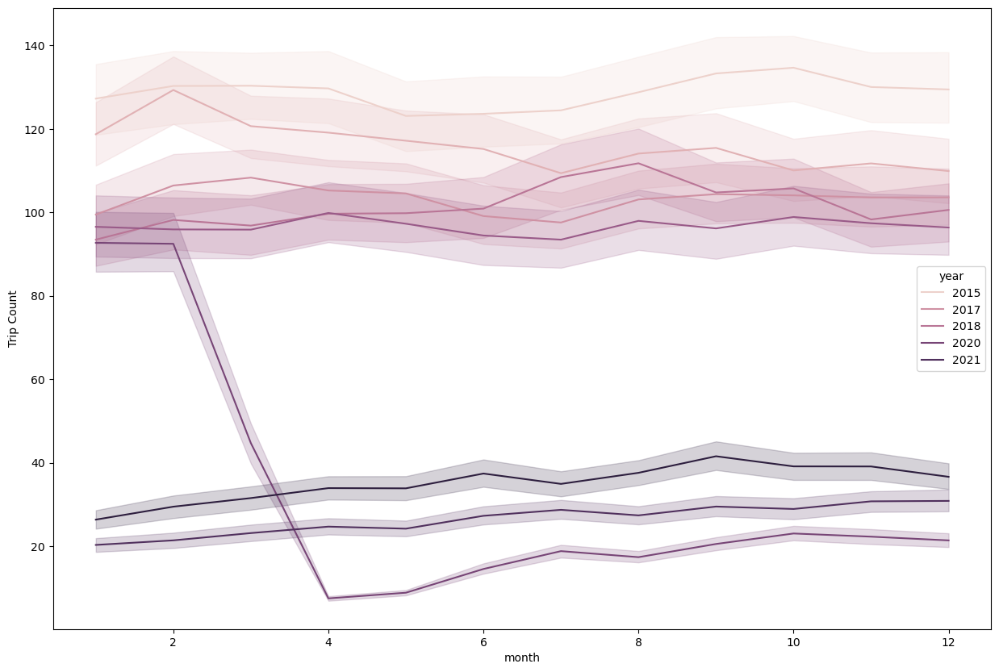

In [49]:
plt.figure(figsize=(15,10))
sns.lineplot(bart_data,x='month',y='Trip Count',hue='year')
plt.show()

In [50]:
#2023 yili icin tahminde bulunuyoruz

In [51]:
bart=bart_data.rename(columns={'Date':'ds','Trip Count':'y'})

In [52]:
#!pip install prophet

10:49:11 - cmdstanpy - INFO - Chain [1] start processing
10:50:25 - cmdstanpy - INFO - Chain [1] done processing


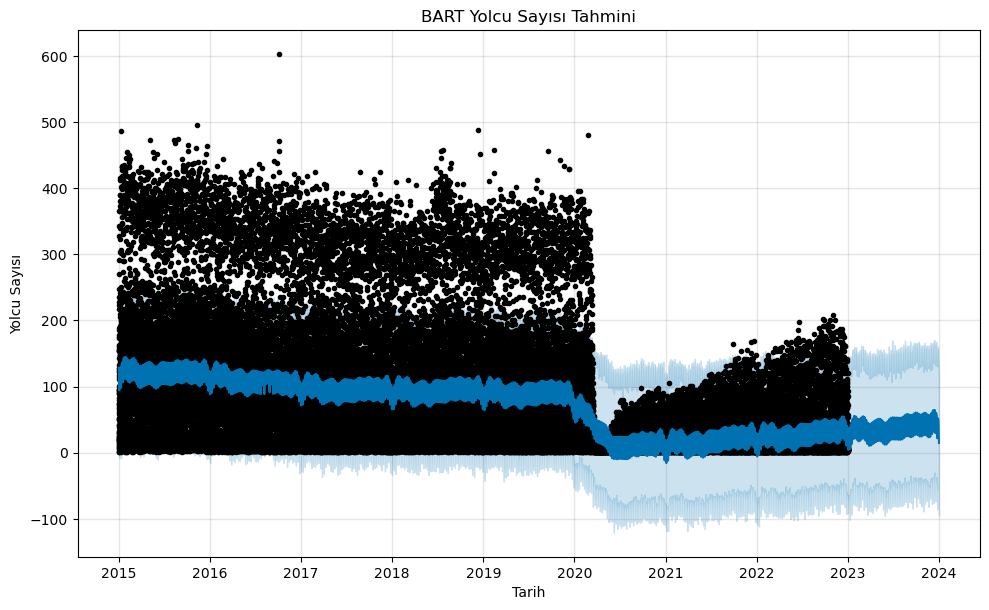

In [53]:
from prophet import Prophet

# Veri hazırlığı
# bart_data adında bir DataFrame'e istasyon verilerinizi yükleyin
# 'ds' sütunu tarihleri, 'y' sütunu yolcu sayılarını içermelidir

# Prophet modelinin oluşturulması
model = Prophet()
model.fit(bart)

# Tahminlerin oluşturulması
future = model.make_future_dataframe(periods=365)  # 1 yıl (365 gün) boyunca tahmin yapar
forecast = model.predict(future)

# Tahminleri görselleştirme
fig = model.plot(forecast)
plt.xlabel('Tarih')
plt.ylabel('Yolcu Sayısı')
plt.title('BART Yolcu Sayısı Tahmini')
plt.show()

In [54]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(model, forecast).update_layout(title="Next Year Trip Count Predictions")

In [55]:
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-01-01,129.999564,24.994114,237.644709,129.999564,129.999564,-1.868055,-1.868055,-1.868055,8.843511,8.843511,8.843511,-10.711567,-10.711567,-10.711567,0.0,0.0,0.0,128.131509
1,2015-01-02,129.988935,17.619430,228.772998,129.988935,129.988935,-3.858315,-3.858315,-3.858315,7.235957,7.235957,7.235957,-11.094272,-11.094272,-11.094272,0.0,0.0,0.0,126.130620
2,2015-01-03,129.978306,6.633862,212.174598,129.978306,129.978306,-22.398584,-22.398584,-22.398584,-11.092736,-11.092736,-11.092736,-11.305848,-11.305848,-11.305848,0.0,0.0,0.0,107.579722
3,2015-01-04,129.967677,-8.607950,195.874826,129.967677,129.967677,-35.864912,-35.864912,-35.864912,-24.522310,-24.522310,-24.522310,-11.342601,-11.342601,-11.342601,0.0,0.0,0.0,94.102765
4,2015-01-05,129.957048,27.374749,225.482817,129.957048,129.957048,-7.975624,-7.975624,-7.975624,3.228792,3.228792,3.228792,-11.204416,-11.204416,-11.204416,0.0,0.0,0.0,121.981424


In [56]:
#elimizde 2023 yilinin bir kisminin verisi var onunla tahmini karsilastiriyoruz

In [57]:
test_data=pd.read_csv('date-hour-soo-dest-2023.csv')

In [58]:
test_data.tail()

,Date,Hour,Origin Station,Destination Station,Trip Count
2815977,2023-05-02,23,WOAK,PLZA,2
2815978,2023-05-02,23,WOAK,POWL,3
2815979,2023-05-02,23,WOAK,RICH,2
2815980,2023-05-02,23,WOAK,SANL,1
2815981,2023-05-02,23,WOAK,WCRK,2


In [59]:
#Soruya cevap verebilmek için Gidilen rotanın "Ashby" ve varış istasyonunun "Powell" olduğu satırları filtreliyoruz
test_data = test_data[(test_data['Origin Station'] == 'POWL') & (test_data['Destination Station'] == 'BALB')]

In [60]:
test_data.head()

,Date,Hour,Origin Station,Destination Station,Trip Count
328,2023-01-01,0,POWL,BALB,11
707,2023-01-01,1,POWL,BALB,7
1049,2023-01-01,2,POWL,BALB,9
1837,2023-01-01,8,POWL,BALB,3
2665,2023-01-01,9,POWL,BALB,4


In [61]:
test_data = test_data.reset_index(drop=True)

In [62]:
#date sutununu tarih formatina ceviriyoruz
test_data['Date']=pd.to_datetime(test_data['Date'],format='%Y-%m-%d')
test_data['year']=test_data['Date'].dt.year
test_data['month']=test_data['Date'].dt.month
# Haftanın günlerini temsil eden yeni bir sütun oluştur
test_data['Weekday'] = test_data['Date'].dt.weekday

# Haftanın günlerini günlere çevir
haftanin_gunleri = ['Pazartesi', 'Salı', 'Çarşamba', 'Perşembe', 'Cuma', 'Cumartesi', 'Pazar']
test_data['Weekday'] = test_data['Weekday'].map(lambda x: haftanin_gunleri[x])

In [63]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2380 entries, 0 to 2379
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Date                 2380 non-null   datetime64[ns]
 1   Hour                 2380 non-null   int64         
 2   Origin Station       2380 non-null   object        
 3   Destination Station  2380 non-null   object        
 4   Trip Count           2380 non-null   int64         
 5   year                 2380 non-null   int64         
 6   month                2380 non-null   int64         
 7   Weekday              2380 non-null   object        
dtypes: datetime64[ns](1), int64(4), object(3)
memory usage: 148.9+ KB


In [64]:
test_data=test_data.rename(columns={'Date':'ds','Trip Count':'y'})

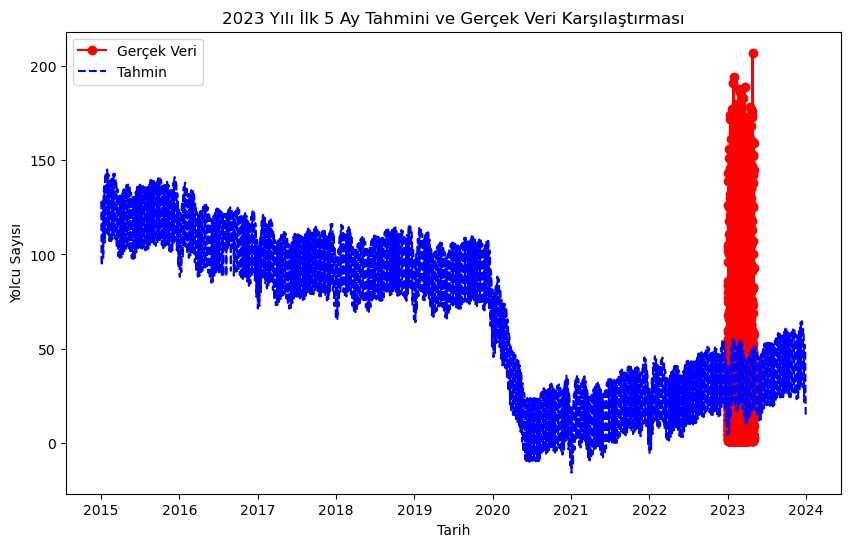

In [65]:
# Grafik oluşturma
plt.figure(figsize=(10, 6))
plt.plot(test_data['ds'], test_data['y'], 'ro-', label='Gerçek Veri')  # Gerçek veri
plt.plot(forecast['ds'], forecast['yhat'], 'b--', label='Tahmin')  # Tahminler
plt.xlabel('Tarih')
plt.ylabel('Yolcu Sayısı')
plt.title('2023 Yılı İlk 5 Ay Tahmini ve Gerçek Veri Karşılaştırması')
plt.legend()
plt.show()

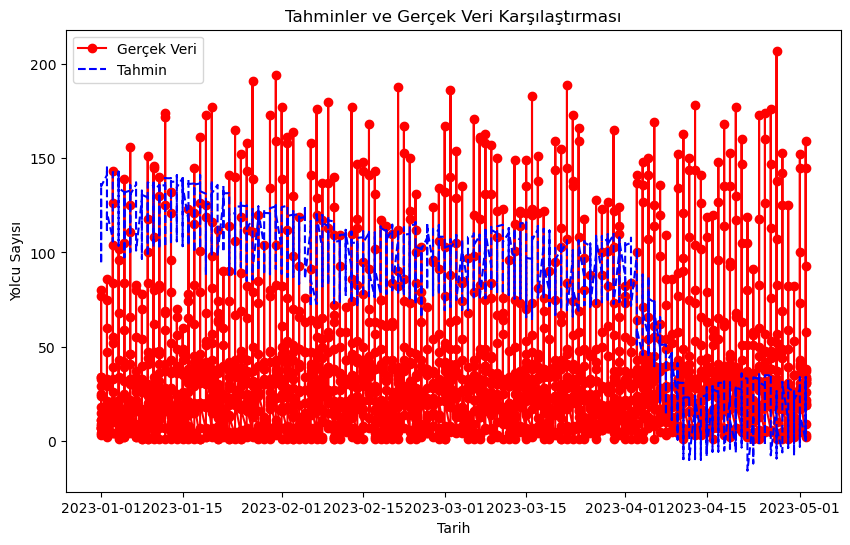

In [66]:
# Tahminlerinizi ve gerçek değerleri içeren DataFrame'i oluşturun
data = pd.DataFrame({
    'ds': test_data['ds'],  # Tarihler
    'y': test_data['y'],  # Gerçek değerler
    'yhat': forecast['yhat']  # Tahminler
})

# Grafik oluşturma
plt.figure(figsize=(10, 6))
plt.plot(data['ds'], data['y'], 'ro-', label='Gerçek Veri')  # Gerçek veri
plt.plot(data['ds'], data['yhat'], 'b--', label='Tahmin')  # Tahminler
plt.xlabel('Tarih')
plt.ylabel('Yolcu Sayısı')
plt.title('Tahminler ve Gerçek Veri Karşılaştırması')
plt.legend()
plt.show()

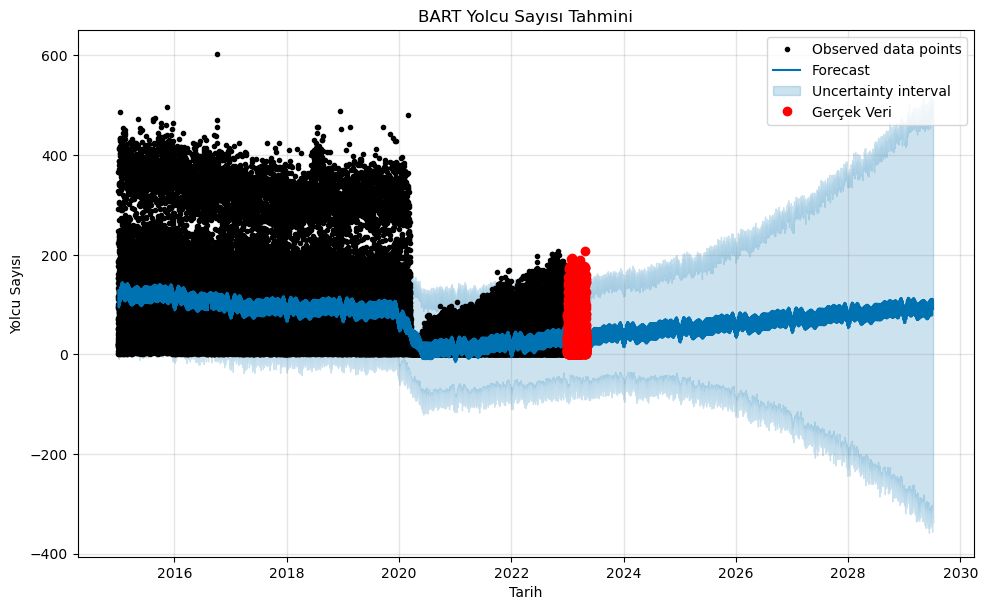

In [67]:
# Test veri seti üzerinde tahminlerin oluşturulması
future = model.make_future_dataframe(periods=len(test_data))  # Test veri seti uzunluğunda tahmin yapar
forecast = model.predict(future)

# Tahminleri ve gerçek değerleri görselleştirme
fig, ax = plt.subplots(figsize=(10, 6))
model.plot(forecast, ax=ax)
ax.plot(test_data['ds'], test_data['y'], 'ro', label='Gerçek Veri')  # Test veri seti
ax.legend()
plt.xlabel('Tarih')
plt.ylabel('Yolcu Sayısı')
plt.title('BART Yolcu Sayısı Tahmini')
plt.show()